<a href="https://colab.research.google.com/github/nikicn/Personal-Protective-Equipment-Detection-using-YOLOv9/blob/main/Train_YOLOv9_Custom_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Step 01: Clone the YOLOv9 Github Repo**

In [1]:
!git clone https://github.com/WongKinYiu/yolov9.git

fatal: destination path 'yolov9' already exists and is not an empty directory.


#**Step 02: Change Current Directory**

In [2]:
%cd yolov9

/content/yolov9


#**Step 03: Install All the Required Packages**

In [3]:
!pip install -r requirements.txt -q

#**Step 04: Download the Model Weights**

**NOTE:** In the YOLOv9 paper, versions yolov9-s and yolov9-m are also mentioned, but the weights for these models are not yet available in the YOLOv9 repository.

In [4]:
import os
HOME = os.getcwd()
print(HOME)

/content/yolov9


In [5]:
!mkdir -p {HOME}/weights

In [6]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt

In [7]:
!ls -la {HOME}/weights

total 237676
drwxr-xr-x  2 root root      4096 Aug 10 09:39 .
drwxr-xr-x 16 root root      4096 Aug 10 09:27 ..
-rw-r--r--  1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r--  1 root root 140217688 Feb 18 12:36 yolov9-e.pt


#**Step 05: Download the Dataset from Roboflow**

In [8]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8joVH7TL2k5V6uScFBEy")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(2)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...


#**Step 06: Train Custom Model**

In [10]:
%cd yolov9

[Errno 2] No such file or directory: 'yolov9'
/content/yolov9


In [11]:
!python train_dual.py --workers 8 --device 0 --batch 8 --data 'PPE_Detection-2/data.yaml' --img 640 --cfg models/detect/yolov9-e.yaml --weights '{HOME}/weights/yolov9-e.pt' --name yolov9-e-finetuning --hyp hyp.scratch-high.yaml --min-items 0 --epochs 30 --close-mosaic 15


2024-08-10 09:40:14.166659: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-10 09:40:14.187600: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-10 09:40:14.193563: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-10 09:40:14.209824: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-10 09:40:15.413160: W tensorflow/comp

#**Download Weights From the Drive**

In [12]:
!gdown "https://drive.google.com/uc?id=140oaWpcxsbZM9glqzeUYHR5gQT_wERX6&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=140oaWpcxsbZM9glqzeUYHR5gQT_wERX6&confirm=t
To: /content/yolov9/best.pt
100% 140M/140M [00:00<00:00, 162MB/s]


##**Step 07: Examine Training Results**

**NOTE:** By default, the results of each subsequent training sessions are saved in `{HOME}/yolov9/runs/train/`, in directories named `exp`, `exp2`, `exp3`, ... You can override this behavior by using the `--name` parameter.

In [13]:
!ls {HOME}/runs/train/yolov9-e-finetuning4/

events.out.tfevents.1723282553.c1b3873efe3e.9012.0  hyp.yaml  opt.yaml	weights


In [14]:
from IPython.display import Image

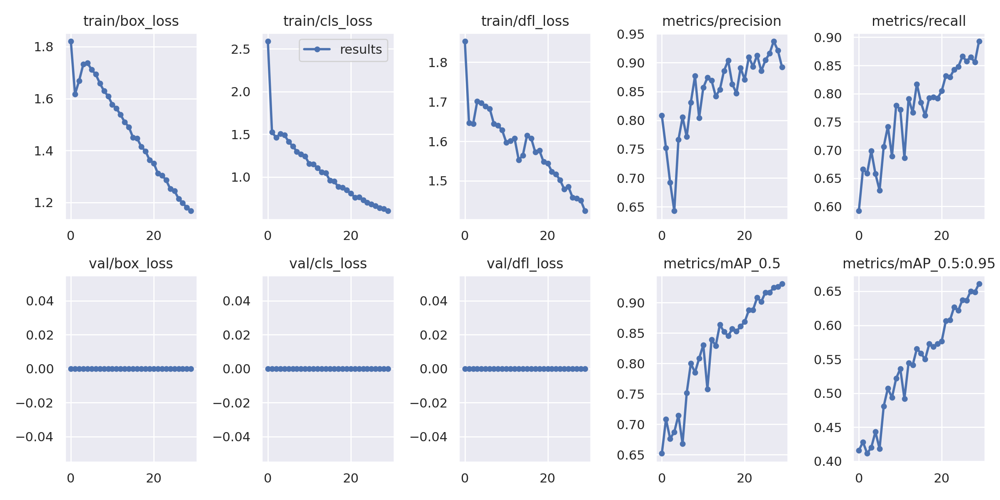

In [16]:
Image(filename=f"{HOME}/runs/train/yolov9-e-finetuning7/results.png", width=1000)

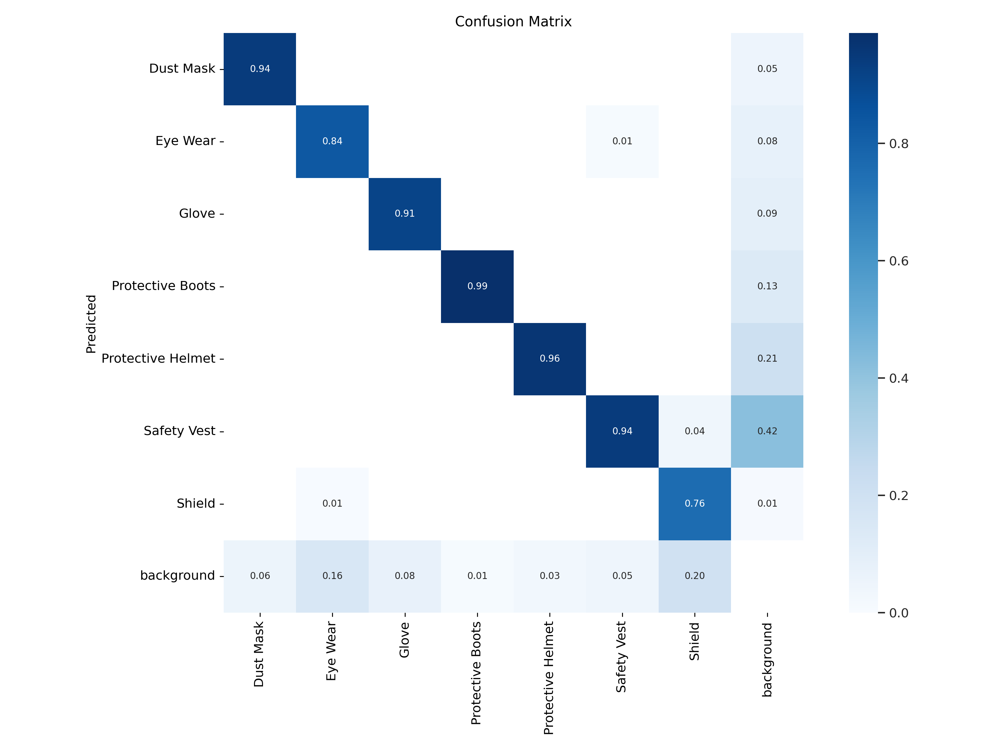

In [18]:
Image(filename=f"{HOME}/runs/train/yolov9-e-finetuning7/confusion_matrix.png", width=1000)

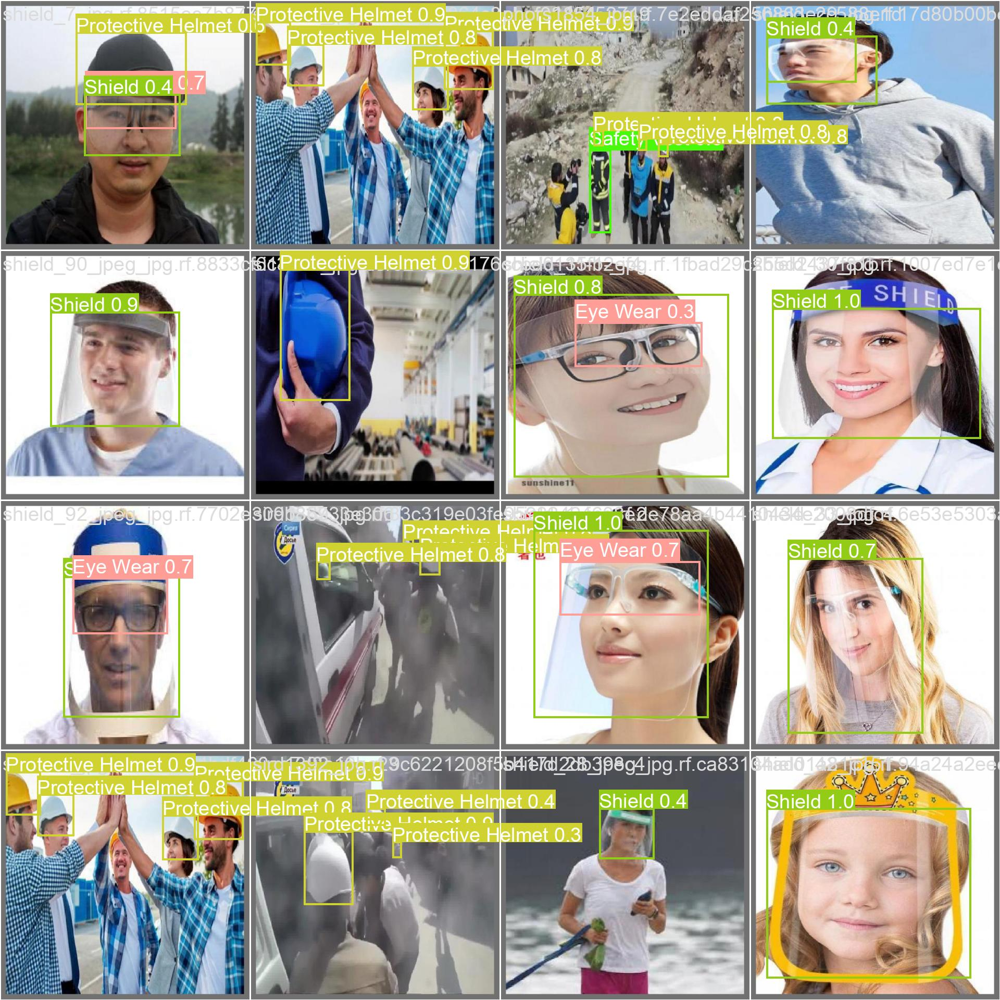

In [19]:
Image(filename=f"{HOME}/runs/train/yolov9-e-finetuning7/val_batch0_pred.jpg", width=1000)

#**Step 08: Validate Custom Model**

In [20]:
# evaluate yolov9 models
!python val_dual.py --data 'PPE_Detection-2/data.yaml' --img 640 --batch 16 --conf 0.001 --iou 0.7 --device 0 --weights 'runs/train/yolov9-e-finetuning7/weights/best.pt' --save-json --name yolov9_ppe_c_640_val


val_dual: data=PPE_Detection-2/data.yaml, weights=['runs/train/yolov9-e-finetuning7/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=yolov9_ppe_c_640_val, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
yolov9-e summary: 839 layers, 68557066 parameters, 0 gradients, 240.7 GFLOPs
val: Scanning /content/yolov9/PPE_Detection-2/valid/labels.cache... 637 images, 0 backgrounds, 0 corrupt: 100% 637/637 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 40/40 [00:57<00:00,  1.44s/it]
                   all        637       3064      0.893      0.892      0.931      0.661
             Dust Mask        637        308     

#**Step 09: Download the Demo Videos**

In [21]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/yolov9/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 47.5MB/s]


In [22]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/yolov9/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 29.0MB/s]


#**Step 10: Inference on Image**

In [23]:
# inference yolov9 models
!python detect_dual.py --source 'PPE_Detection-2/valid/images/85_jpg.rf.bb831a912c797ce2a13ad85fe9e6094e.jpg' --img 640 --device 0 --weights 'best.pt' --name yolov9_c_ppe_640_detect


detect_dual: weights=['best.pt'], source=PPE_Detection-2/valid/images/85_jpg.rf.bb831a912c797ce2a13ad85fe9e6094e.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov9_c_ppe_640_detect, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
yolov9-e summary: 839 layers, 68557066 parameters, 0 gradients, 240.7 GFLOPs
image 1/1 /content/yolov9/PPE_Detection-2/valid/images/85_jpg.rf.bb831a912c797ce2a13ad85fe9e6094e.jpg: 640x640 1 Protective Helmet, 1 Safety Vest, 99.1ms
Speed: 0.7ms pre-process, 99.1ms inference, 869.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/yolov9_c_

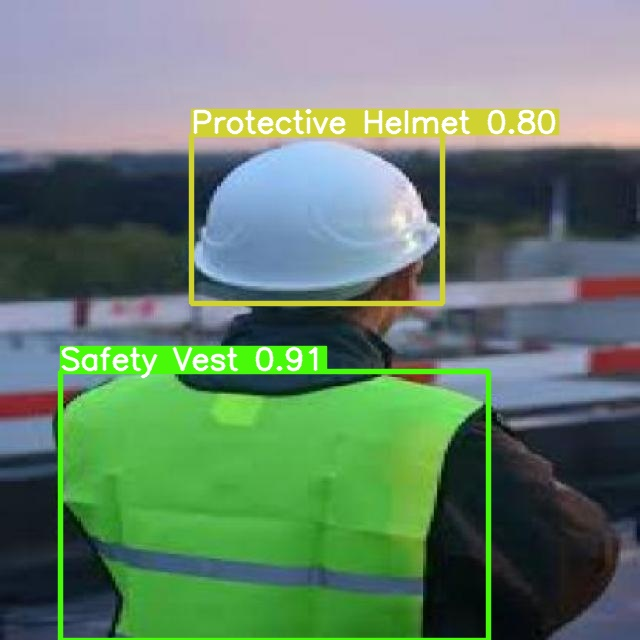

In [24]:
Image(filename=f"{HOME}/runs/detect/yolov9_c_ppe_640_detect/85_jpg.rf.bb831a912c797ce2a13ad85fe9e6094e.jpg")

#**Step 11: Inference on Video**

In [25]:
# inference yolov9 models
!python detect_dual.py --source 'PPE_Part1.mp4' --img 640 --device 0 --weights 'best.pt' --name yolov9_ppe_640_detect


detect_dual: weights=['best.pt'], source=PPE_Part1.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov9_ppe_640_detect, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
yolov9-e summary: 839 layers, 68557066 parameters, 0 gradients, 240.7 GFLOPs
video 1/1 (1/310) /content/yolov9/PPE_Part1.mp4: 384x640 2 Protective Helmets, 5 Safety Vests, 143.0ms
video 1/1 (2/310) /content/yolov9/PPE_Part1.mp4: 384x640 2 Protective Helmets, 5 Safety Vests, 66.6ms
video 1/1 (3/310) /content/yolov9/PPE_Part1.mp4: 384x640 2 Protective Helmets, 5 Safety Vests, 66.1ms
video 1/1 (4/310) /content/yolov9/PPE_Par

#**Display the Output Video**

In [47]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [48]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/yolov9_ppe_640_detect/PPE_Part1.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

FileNotFoundError: [Errno 2] No such file or directory: '/content/result_compressed.mp4'

In [39]:
# inference yolov9 models
!python detect_dual.py --source 'PPE_Part2.mp4' --img 640 --device 0 --weights 'best.pt' --name yolov9_ppe_640_detect2


detect_dual: weights=['best.pt'], source=PPE_Part2.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=yolov9_ppe_640_detect2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-104-g5b1ea9a Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
yolov9-e summary: 839 layers, 68557066 parameters, 0 gradients, 240.7 GFLOPs
video 1/1 (1/267) /content/yolov9/PPE_Part2.mp4: 384x640 (no detections), 148.2ms
video 1/1 (2/267) /content/yolov9/PPE_Part2.mp4: 384x640 1 Protective Helmet, 2 Safety Vests, 57.4ms
video 1/1 (3/267) /content/yolov9/PPE_Part2.mp4: 384x640 1 Protective Helmet, 2 Safety Vests, 57.5ms
video 1/1 (4/267) /content/yolov9/PPE_Part2.mp4: 384x640 2 Safe

#**Display the Output Video**

In [42]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/yolov9_ppe_640_detect2/PPE_Part2.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)